In [1]:
import requests
import pandas as pd
import os
import time
import numpy as np
from tqdm import tqdm
from glob import glob
import json

## 1. Download all Images

In [2]:
DATA_PATH = '../../Data.nosync/'

# Get all image dicts
img_dicts = glob(f"{DATA_PATH}Zalando_Germany_Dataset/image_dicts/dresses/*.json")

# Extract all urls
urls = {}
for file in img_dicts:
    with open(file, 'r') as f:
        img_dict = json.load(f)
    img_dict = {k:v['packshot_link'] for k,v in img_dict.items() if v['packshot_link']}
    urls.update(img_dict)

print(f"There are in total {len(urls)} packshot urls available")

There are in total 14758 packshot urls available


In [3]:
width = 1024

# Adapt urls for correct image size
urls = {k:v.replace('imwidth=500', f'imwidth={width}') for k,v in urls.items()}

existing_files = glob(DATA_PATH + 'Zalando_Germany_Dataset/dresses/images/raw_images/*.jpg')
existing_files = [elem.split('/')[-1].split('.')[0] for elem in existing_files]

print("Already downloaded images: ", len(existing_files))

# Remove existing files from urls
urls = {k:v for k,v in urls.items() if k not in existing_files}
print(f"Images to download: {len(urls)}")

Already downloaded images:  14067
Images to download: 691


In [4]:
def download_image(sku, url):
    save_path = f"{DATA_PATH}Zalando_Germany_Dataset/dresses/images/raw_images/{sku}.jpg"
    img_data = requests.get(url).content
    with open(save_path, 'wb') as handler:
            handler.write(img_data)   

for sku, url in tqdm(urls.items()):
    download_image(sku, url)
    time.sleep(np.random.uniform(0,1))     

100%|██████████| 691/691 [08:35<00:00,  1.34it/s]


## 2. Identifying non-typical Images which need to be removed

In [5]:
import torchvision
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import torch.nn as nn
import torch
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
images = glob(DATA_PATH + 'Zalando_Germany_Dataset/dresses/images/raw_images/*.jpg')
print(len(images))

14758


#### Using Conv-Features

In [7]:
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print(f"Using device: {device}")

# Load ResNet50 model with pretrained weights
weights = ResNet50_Weights.IMAGENET1K_V1
model = resnet50(weights=weights)
preprocess = weights.transforms()
# Remove last Pooling and FC layer
model = nn.Sequential(*list(model.children())[:-1])
model = model.to(device)
model.eval()

Using device: mps


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [8]:
def get_features(path):
    input = Image.open(path)
    preprocessed_input = preprocess(input).to(device)
    output = model(preprocessed_input.unsqueeze(0)).detach().cpu().numpy()
    return output

features = {}
for path in tqdm(images):
    sku = path.split('/')[-1].split('.')[0]
    output = get_features(path)
    features[sku] = output
features_df = pd.concat([pd.DataFrame(v.reshape(1,-1), index=[k]) for k,v in features.items()])

100%|██████████| 14758/14758 [07:21<00:00, 33.45it/s]


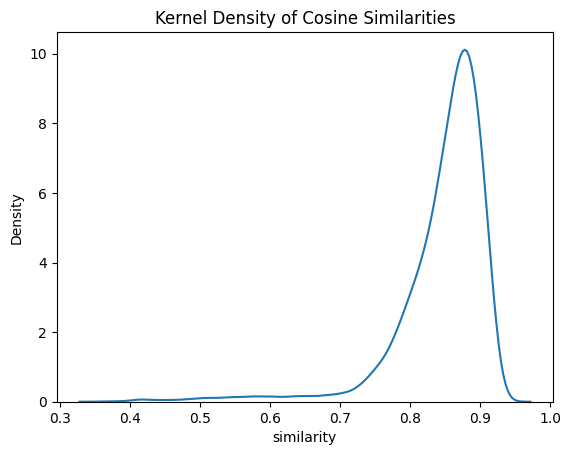

Num images with similarity < 0.4: 8
Num images with similarity < 0.45: 50
Num images with similarity < 0.5: 98
Num images with similarity < 0.55: 186
Num images with similarity < 0.6: 297
Num images with similarity < 0.65: 409
Num images with similarity < 0.7: 540
Num images with similarity < 0.75: 888
Num images with similarity < 0.8: 2242
Num images with similarity < 0.85: 5910
Num images with similarity < 0.9: 12957
Num images with similarity < 0.95: 14758


In [9]:
# Calculate mean features
mean_features = np.array([pd.DataFrame(v.reshape(1,-1), index=[k]) for k,v in features.items()]).mean(axis=0)
# Calculate cosine similarities
similarities = {k:nn.functional.cosine_similarity(torch.tensor(v.reshape(1,-1)), torch.tensor(mean_features)).item() for k,v in features.items()}

df = pd.DataFrame(similarities.items(), columns=['sku', 'similarity']).sort_values('similarity', ascending=False)

sns.kdeplot(df['similarity'])
plt.title('Kernel Density of Cosine Similarities')
plt.show()

for i in np.arange(0.4,1,0.05):
    print(f"Num images with similarity < {np.round(i,2)}: {len(df[df['similarity'] < i])}")

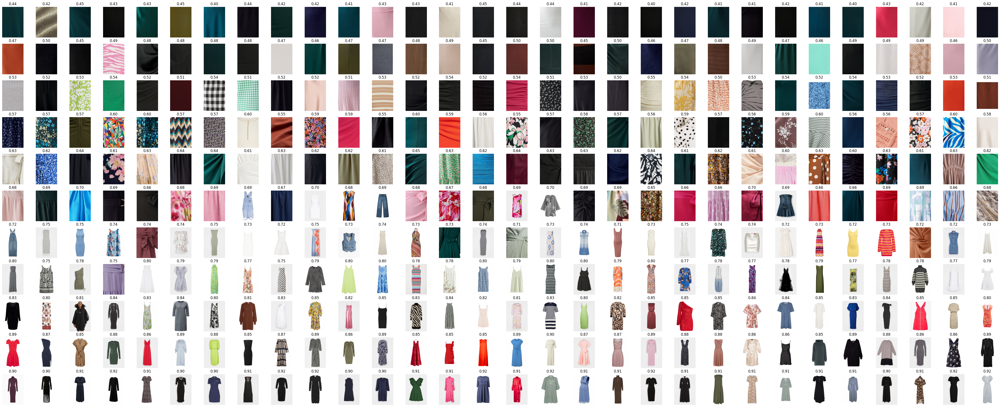

In [10]:
# Print some examples for each similarity bracket
NUM_COLS = 30

fig, ax = plt.subplots(11, NUM_COLS, figsize=(NUM_COLS*2, 24))
for row, i in enumerate(np.arange(0.45,1,0.05)):
    sample = df[(df['similarity'] < i) & (df['similarity']>(i-0.05))].sample(NUM_COLS).reset_index(drop=True)
    for j in range(NUM_COLS):
        sku = sample.iloc[j]['sku']
        similarity = sample.iloc[j]['similarity']
        img = Image.open(DATA_PATH + f'Zalando_Germany_Dataset/dresses/images/raw_images/{sku}.jpg')
        ax[row,j].imshow(img)
        ax[row,j].axis('off')
        ax[row,j].set_title(f"{similarity:.2f}")
plt.show()

### Result: 
- Images with similarity < 0.7 can be removed directly
- Images with similarity between 0.7 and 0.8 need some more investiation

In [11]:
sku_to_remove = list(df[df['similarity'] < 0.7]['sku'].values)
print(f"Removing {len(sku_to_remove)} images")

Removing 540 images


### Further investigation of images with similarity between 0.7 and 0.8

In [12]:
skus = df[(df.similarity >= 0.7) & (df.similarity < 0.8)]['sku'].values
print(f"Num images with similarity between 0.7 and 0.8: {len(skus)}")

Num images with similarity between 0.7 and 0.8: 1702


#### Using background pixel values

In [13]:
def check_corner_pixels_identical(path):
    # Read in image
    pil_img = Image.open(path)
    img = np.array(pil_img)

    # Get corner pixels
    max_x = img.shape[0]
    max_y = img.shape[1]

    corner_pixels = [
        img[0,0,:],
        img[0,max_y-1,:],
        img[max_x-1,0,:],
        img[max_x-1,max_y-1,:]
    ]
    std = np.array(corner_pixels).std()
    return corner_pixels, std


imgs = {}
for sku in tqdm(skus):
    path = DATA_PATH + f'Zalando_Germany_Dataset/dresses/images/raw_images/{sku}.jpg'
    _, std = check_corner_pixels_identical(path)
    imgs[path] = [std]
corner_values_df = pd.DataFrame(imgs.values(), index=imgs.keys(), columns=['std']).reset_index().rename(columns={'index':'path'}).sort_values('std', ascending=False)
# Remove images with zero std
corner_values_df = corner_values_df[corner_values_df['std'] > 0]

100%|██████████| 1702/1702 [00:13<00:00, 125.28it/s]


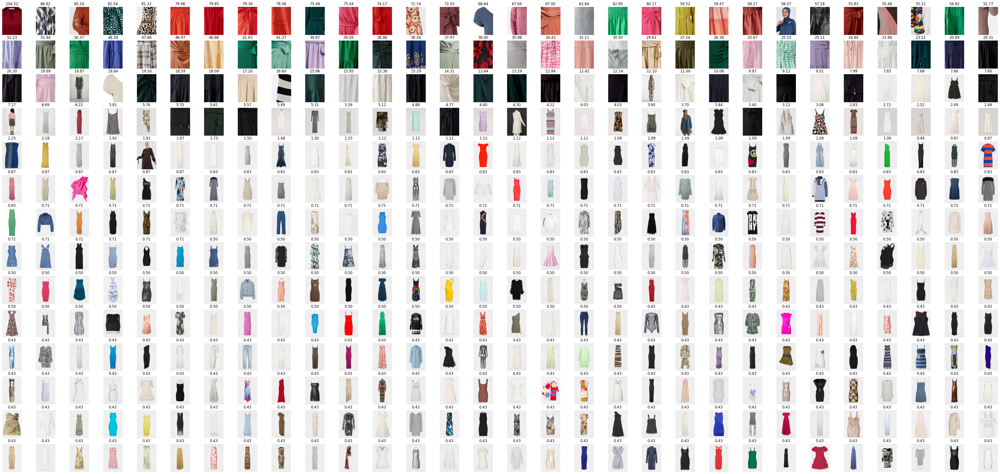

In [14]:
NUM_COLS = 30
num_to_plot = (corner_values_df.shape[0]//NUM_COLS)*NUM_COLS
fig, ax = plt.subplots(num_to_plot//NUM_COLS, NUM_COLS, figsize=(NUM_COLS*2, num_to_plot//NUM_COLS*2))
axs = ax.ravel()
for i in range(num_to_plot):
    path = corner_values_df.iloc[i]['path']
    img = Image.open(path)
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(f"{corner_values_df.iloc[i]['std']:.2f}")

### Result: 
- Images with standard deviations above 5 will be calssified as faulty

In [15]:
sku_to_remove2 = [elem.split('/')[-1].split('.')[0] for elem in corner_values_df[corner_values_df['std'] > 5].path]
print(f"Removing {len(sku_to_remove2)} images")

Removing 102 images


In [16]:
sku_to_remove_total = list(set(sku_to_remove + sku_to_remove2))
print(f"Total images to remove: {len(sku_to_remove_total)}")

Total images to remove: 642


### Performing the final removal

- Removel must take plave in multiple steps:
    - Go through all image_dicts and remove packshot image url for each item in identified above
    - Delete the images from the image folder

In [17]:
# import shutil
# for sku in tqdm(sku_to_remove_total):
#     path = DATA_PATH + f'Zalando_Germany_Dataset/dresses/images/raw_images/{sku}.jpg'
#     shutil.copyfile(path, DATA_PATH + f'Zalando_Germany_Dataset/dresses/images/to_remove/{sku}.jpg')

#### 1. Update image_dicts

In [18]:
for file in tqdm(img_dicts):
    with open(file, 'r') as f:
        img_dict = json.load(f)

    for sku in sku_to_remove_total:
        if sku in img_dict:
            img_dict[sku]['packshot_link'] = None
        else:
            continue
    
    # Save updated image dict
    with open(file, 'w') as f:
        json.dump(img_dict, f)

100%|██████████| 10/10 [00:00<00:00, 47.74it/s]


#### 2. Delete images


In [19]:
for sku in tqdm(sku_to_remove_total):
    path = DATA_PATH + f'Zalando_Germany_Dataset/dresses/images/raw_images/{sku}.jpg'
    os.remove(path)

100%|██████████| 642/642 [00:00<00:00, 6124.71it/s]
